# Cat Face Generation with Generative Models

In this project, we build generative models to create synthetic cat faces.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
import zipfile
import os
from pathlib import Path

## Data Collection

Download and extract the cats faces dataset (64x64 images).

In [3]:
# Dataset URL from Kaggle (direct download)
# Note: You may need to download manually from:
# https://www.kaggle.com/datasets/spandan2/cats-faces-64x64-for-generative-models

# For this exercise, we'll assume you have downloaded and extracted the dataset
data_dir = 'cats_dataset'  # Update this path to your dataset location

# If you have the dataset as a zip file, uncomment to extract:
with zipfile.ZipFile('archive.zip', 'r') as zip_ref:
    zip_ref.extractall(data_dir)

print(f"Dataset directory: {data_dir}")

Dataset directory: cats_dataset


## Data Loading

Load the cat face images into a numpy array.

In [2]:
def load_cat_images(data_dir, max_images=None):
    """
    Load cat face images from directory
    Returns: numpy array of shape (n_samples, 64, 64, 3)
    """
    image_files = list(Path(data_dir).glob('*.jpg')) + list(Path(data_dir).glob('*.png'))
    
    if max_images:
        image_files = image_files[:max_images]
    
    images = []
    for img_path in image_files:
        img = Image.open(img_path).convert('RGB')
        img = img.resize((64, 64))  # Ensure 64x64
        images.append(np.array(img))
    
    return np.array(images)


In [3]:
data_dir="cats_dataset/cats"
# Load images
images = load_cat_images(data_dir)
print(f"Loaded {len(images)} images")
print(f"Image shape: {images[1].shape}")
print(f"Data type: {images.dtype}")
print(f"Value range: [{images.min()}, {images.max()}]")

Loaded 15747 images
Image shape: (64, 64, 3)
Data type: uint8
Value range: [0, 255]


## Data Visualization

Display sample cat face images.

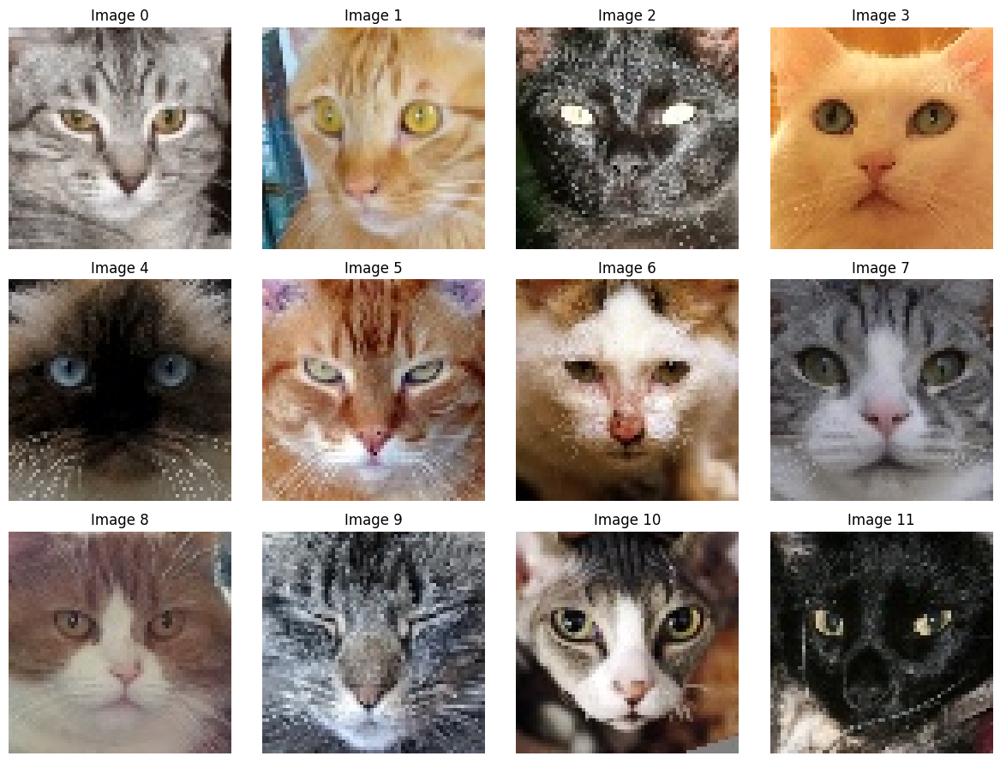

In [4]:
# Display 12 sample images
fig, axes = plt.subplots(3, 4, figsize=(12, 9))
axes = axes.flatten()

for i in range(12):
    axes[i].imshow(images[i])
    axes[i].axis('off')
    axes[i].set_title(f'Image {i}')

plt.tight_layout()
plt.show()

## Data Preparation

Normalize images and prepare for model training.

In [5]:
# Normalize to [0, 1] range
images_normalized = images.astype('float32') / 255.0
images_normalized=images_normalized.transpose(0,3,1,2)
# For some models (like GANs), you may want [-1, 1] range:
# images_normalized = (images.astype('float32') - 127.5) / 127.5

print(f"Normalized shape: {images_normalized.shape}")
print(f"Normalized range: [{images_normalized.min():.3f}, {images_normalized.max():.3f}]")

# Split into train/validation sets
split_idx = int(0.9 * len(images_normalized))
train_images = images_normalized[:split_idx]
val_images = images_normalized[split_idx:]

print(f"\nTraining samples: {len(train_images)}")
print(f"Validation samples: {len(val_images)}")

Normalized shape: (15747, 3, 64, 64)
Normalized range: [0.000, 1.000]

Training samples: 14172
Validation samples: 1575


## **Variational Autoencoder (VAE)**


- Build an encoder to map images to latent space
- Build a decoder to reconstruct images from latent vectors
- Use VAE loss (reconstruction + KL divergence)
- Generate new cats by sampling from latent space


In [7]:
#Option1: VAE

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset


class VAE(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, 2, 1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, 2, 1),
            nn.ReLU()
        )

        # Latent distribution parameters
        self.fc_mu = nn.Linear(64*16*16, latent_dim)
        self.fc_logvar = nn.Linear(64*16*16, latent_dim)
        self.fc_decode = nn.Linear(latent_dim, latent_dim * 8 * 8)
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 64, 4, 2, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, 2, 1),
            nn.Sigmoid()
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def forward(self,x):
        h=self.encoder(x)
        #print(h.shape)
        x=h.view(h.size(0),-1)
        x_mu=self.fc_mu(x)
        x_logvar=self.fc_logvar(x)
        z=self.reparameterize(x_mu,x_logvar)
        h_dec=self.fc_decode(z)
        h_dec = h_dec.view(h_dec.size(0),z.size(1), 8, 8)    
        x_recon=self.decoder(h_dec)
        return x_recon, x_mu, x_logvar


In [8]:
# Check CUDA availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize baseline model
Vae_model = VAE(latent_dim=128).to(device)

Using device: cpu


In [9]:
train_images_tensor=torch.tensor(train_images).to(torch.float32)
val_images_tensor=torch.tensor(val_images).to(torch.float32)

train_dataset=TensorDataset(train_images_tensor)
val_dataset=TensorDataset(val_images_tensor)

batch_size=64

train_loader=DataLoader(train_dataset,batch_size=batch_size,shuffle=True)
val_loader=DataLoader(val_dataset, batch_size=batch_size,shuffle=True)

In [57]:
for batch in train_loader:
    x = batch[0]
    print(x.shape)
    break

torch.Size([64, 3, 64, 64])


In [62]:
import torch.optim as optim
import torch.nn.functional as F

def train_epoch(model, loader, optimizer, device):
    model.train()
    total_loss = 0

    for batch in loader:
        x=batch[0].to(device)

        #forward
        x_recon,mu,logvar=model(x)

        #reconstruction loss
        recon_loss = F.mse_loss(x_recon, x, reduction="sum") / x.size(0)
        #KL loss
        KL_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)
        #total loss
        loss=0.1*KL_loss+recon_loss
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        total_loss+=loss.item()
    return total_loss / len(loader)



def evaluate(model, loader, device):
    model.eval()
    total_loss = 0
    
    with torch.no_grad():
        for batch in loader:
            x=batch[0].to(device)
            x_recon,mu,logvar=model(x)
            
            #reconstruction loss
            recon_loss = F.mse_loss(x_recon, x, reduction="sum") / x.size(0)
            #KL loss
            KL_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)
            #total loss
            loss=0.1*KL_loss+recon_loss

            total_loss += loss.item()
    
    return total_loss / len(loader)

def train_model(model, train_loader, val_loader, device, epochs=30, lr=1e-3):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    history = {'train_loss': [], 'val_loss': []}
    
    for epoch in range(epochs):
        train_loss = train_epoch(model, train_loader, optimizer, device)
        val_loss = evaluate(model, val_loader, device)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        
        print(f"Epoch {epoch+1}/{epochs} - "
              f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
    
    return history


def plot_training_history(history, title="Training History"):
    plt.figure(figsize=(6,4))
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

Epoch 1/10 - Train Loss: 334.1095 | Val Loss: 184.5674
Epoch 2/10 - Train Loss: 164.7895 | Val Loss: 146.1477
Epoch 3/10 - Train Loss: 139.5507 | Val Loss: 132.8067
Epoch 4/10 - Train Loss: 127.7847 | Val Loss: 123.1162
Epoch 5/10 - Train Loss: 121.8856 | Val Loss: 119.7944
Epoch 6/10 - Train Loss: 116.3684 | Val Loss: 118.0122
Epoch 7/10 - Train Loss: 113.4808 | Val Loss: 113.0452
Epoch 8/10 - Train Loss: 111.3989 | Val Loss: 110.9095
Epoch 9/10 - Train Loss: 108.9738 | Val Loss: 109.2881
Epoch 10/10 - Train Loss: 106.8495 | Val Loss: 107.9757


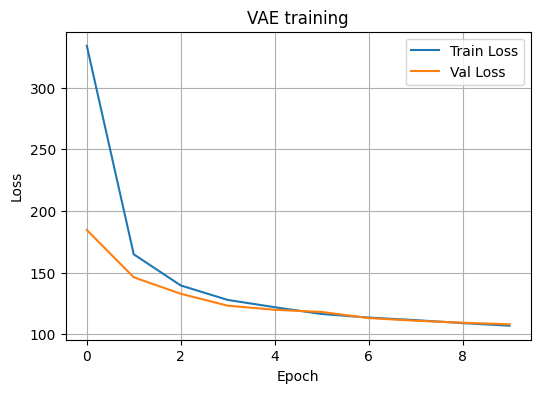

In [63]:
history = train_model(Vae_model, train_loader, val_loader, device, epochs=10, lr=1e-3)
plot_training_history(history, title="VAE training")

0.00824748631566763 0.9790204167366028 0.49600228667259216
0.00824748631566763 0.9790204167366028 0.49600228667259216
0.00824748631566763 0.9790204167366028 0.49600228667259216
0.00824748631566763 0.9790204167366028 0.49600228667259216
0.00824748631566763 0.9790204167366028 0.49600228667259216
0.00824748631566763 0.9790204167366028 0.49600228667259216
0.00824748631566763 0.9790204167366028 0.49600228667259216
0.00824748631566763 0.9790204167366028 0.49600228667259216


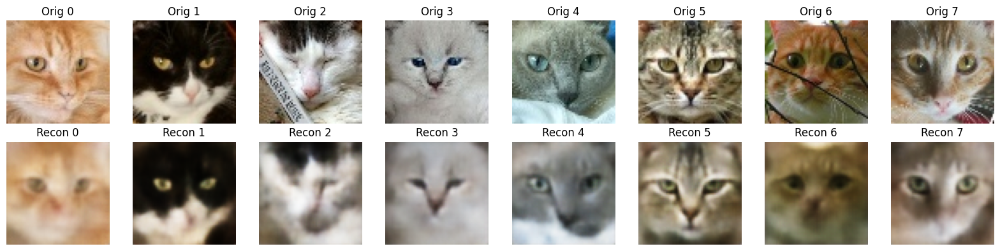

In [64]:
import matplotlib.pyplot as plt

Vae_model.eval()

# Nombre d'images à afficher
n = 8  

with torch.no_grad():
    # On récupère un batch de la validation
    batch = next(iter(val_loader))
    x = batch[0].to(device)             # (B, 3, 64, 64)

    # Passer dans le VAE
    x_recon, mu, logvar = Vae_model(x)  # (B, 3, 64, 64)

# On ne garde que les n premières et on repasse sur CPU
x = x[:n].cpu()
x_recon = x_recon[:n].cpu()

# Plot : ligne 1 = originales, ligne 2 = reconstructions
fig, axes = plt.subplots(2, n, figsize=(2*n, 4))

for i in range(n):
    # Originale
    print(x_recon.min().item(), x_recon.max().item(), x_recon.mean().item())
    axes[0, i].imshow(x[i].permute(1, 2, 0).numpy())
    axes[0, i].axis("off")
    axes[0, i].set_title(f"Orig {i}")

    # Reconstruction
    axes[1, i].imshow(x_recon[i].permute(1, 2, 0).numpy())
    axes[1, i].axis("off")
    axes[1, i].set_title(f"Recon {i}")

plt.tight_layout()
plt.show()

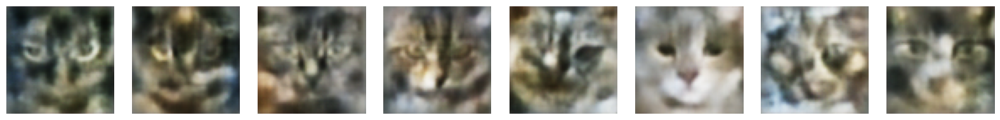

In [65]:
Vae_model.eval()

n_samples = 8   # nombre de chats à générer
latent_dim = 128  # le même que celui utilisé pour ton VAE

with torch.no_grad():
    # z ~ N(0, I)
    z = torch.randn(n_samples, latent_dim).to(device)

    # Même pipeline que dans forward, mais sans encoder
    h_dec = Vae_model.fc_decode(z)                        # (n_samples, latent_dim*8*8)
    h_dec = h_dec.view(h_dec.size(0), latent_dim, 8, 8)   # (n_samples, latent_dim, 8, 8)
    samples = Vae_model.decoder(h_dec)                    # (n_samples, 3, 64, 64)

samples = samples.cpu()

# Affichage
fig, axes = plt.subplots(1, n_samples, figsize=(2*n_samples, 2))

for i in range(n_samples):
    axes[i].imshow(samples[i].permute(1, 2, 0).numpy())
    axes[i].axis("off")

plt.tight_layout()
plt.show()

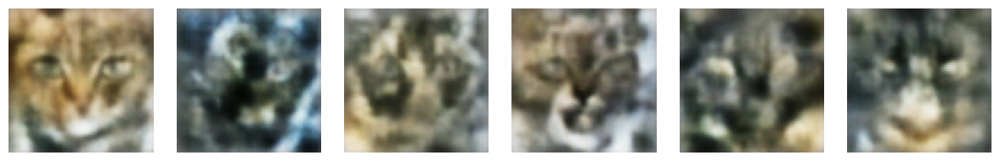

In [81]:
Vae_model.eval()

n_samples = 6 # nombre de chats à générer
latent_dim = 128  # le même que celui utilisé pour ton VAE

with torch.no_grad():
    # z ~ N(0, I)
    z = torch.randn(n_samples, latent_dim).to(device)

    # Même pipeline que dans forward, mais sans encoder
    h_dec = Vae_model.fc_decode(z)                        # (n_samples, latent_dim*8*8)
    h_dec = h_dec.view(h_dec.size(0), latent_dim, 8, 8)   # (n_samples, latent_dim, 8, 8)
    samples = Vae_model.decoder(h_dec)                    # (n_samples, 3, 64, 64)

samples = samples.cpu()

# Affichage
fig, axes = plt.subplots(1, n_samples, figsize=(2*n_samples, 2))

for i in range(n_samples):
    axes[i].imshow(samples[i].permute(1, 2, 0).numpy())
    axes[i].axis("off")

plt.tight_layout()
plt.show()

## **Generative Adversarial Network (GAN)**

- Build a generator to create images from noise
- Build a discriminator to distinguish real from fake
- Train adversarially using minimax loss
- Generate new cats from random noise vectors

In [10]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

#Preprocessing pour Gan model

images_normalized = (images.astype('float32') - 127.5) / 127.5

images_normalized = images_normalized.transpose(0,3,1,2)
print(f"Normalized shape: {images_normalized.shape}")
print(f"Normalized range: [{images_normalized.min():.3f}, {images_normalized.max():.3f}]")

# Split into train/validation sets
split_idx = int(0.9 * len(images_normalized))
train_images = images_normalized[:split_idx]
val_images = images_normalized[split_idx:]

print(f"\nTraining samples: {len(train_images)}")
print(f"Validation samples: {len(val_images)}")



train_images_tensor=torch.tensor(train_images).to(torch.float32)
val_images_tensor=torch.tensor(val_images).to(torch.float32)

train_dataset=TensorDataset(train_images_tensor)
val_dataset=TensorDataset(val_images_tensor)

batch_size=64

train_loader=DataLoader(train_dataset,batch_size=batch_size,shuffle=True)
val_loader=DataLoader(val_dataset, batch_size=batch_size,shuffle=True)

Normalized shape: (15747, 3, 64, 64)
Normalized range: [-1.000, 1.000]

Training samples: 14172
Validation samples: 1575


In [11]:
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super().__init__()
        self.latent_dim = latent_dim

        self.net = nn.Sequential(
            # input: (B, latent_dim, 1, 1)
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0),   # -> (B, 512, 4, 4)
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, 2, 1),          # -> (B, 256, 8, 8)
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1),          # -> (B, 128, 16, 16)
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1),           # -> (B, 64, 32, 32)
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, 2, 1),             # -> (B, 3, 64, 64)
            nn.Tanh()
        )

    def forward(self, z):
        # z: (B, latent_dim)
        z = z.view(z.size(0), self.latent_dim, 1, 1)
        x = self.net(z)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            # input: (B, 3, 64, 64)
            nn.Conv2d(3, 64, 4, 2, 1),      # -> (B, 64, 32, 32)
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1),    # -> (B, 128, 16, 16)
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1),   # -> (B, 256, 8, 8)
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1),   # -> (B, 512, 4, 4)
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 0),     # -> (B, 1, 1, 1)
            nn.Sigmoid()
        )

    def forward(self, x):
        out = self.net(x)
        return out.view(-1, 1)   # (B, 1)

In [86]:
latent_dim = 100
G = Generator(latent_dim).to(device)
D = Discriminator().to(device)

z = torch.randn(16, latent_dim).to(device)
fake = G(z)
print("fake:", fake.shape)   # attendu: torch.Size([16, 3, 64, 64])

out = D(fake)
print("D(fake):", out.shape) # attendu: torch.Size([16, 1])

fake: torch.Size([16, 3, 64, 64])
D(fake): torch.Size([16, 1])


fake: torch.Size([16, 3, 64, 64])
D(fake): torch.Size([16, 1])
Epoch [1/50]  D_loss: 0.7911  G_loss: 1.6455
Epoch [2/50]  D_loss: 0.9244  G_loss: 2.5998
Epoch [3/50]  D_loss: 1.1101  G_loss: 0.9814
Epoch [4/50]  D_loss: 1.1172  G_loss: 0.8495
Epoch [5/50]  D_loss: 0.9301  G_loss: 1.3884


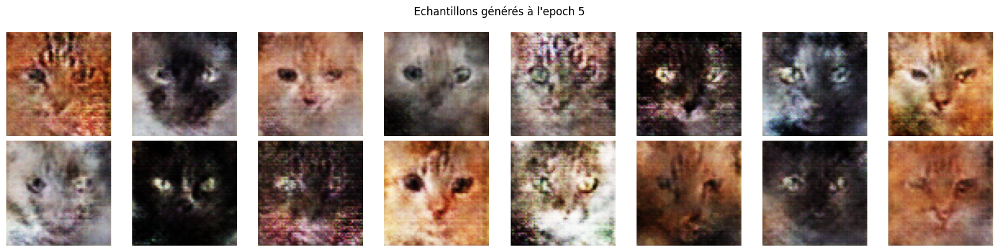

Epoch [6/50]  D_loss: 1.4904  G_loss: 2.7274
Epoch [7/50]  D_loss: 1.1442  G_loss: 0.7507
Epoch [8/50]  D_loss: 0.9384  G_loss: 0.8422
Epoch [9/50]  D_loss: 0.9718  G_loss: 0.6030
Epoch [10/50]  D_loss: 0.9569  G_loss: 2.3057


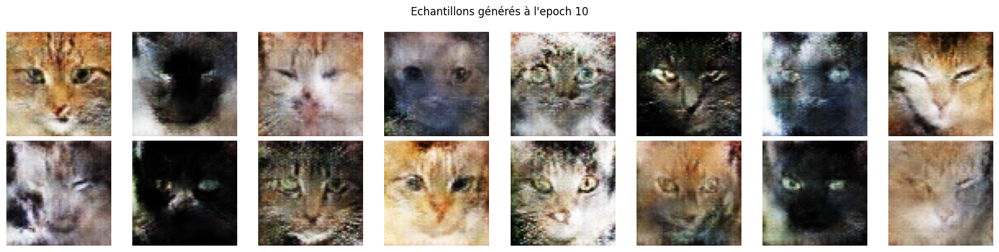

Epoch [11/50]  D_loss: 0.9660  G_loss: 0.8041
Epoch [12/50]  D_loss: 0.6775  G_loss: 0.7484
Epoch [13/50]  D_loss: 0.5781  G_loss: 0.6041
Epoch [14/50]  D_loss: 0.5716  G_loss: 0.6470
Epoch [15/50]  D_loss: 1.2881  G_loss: 5.2596


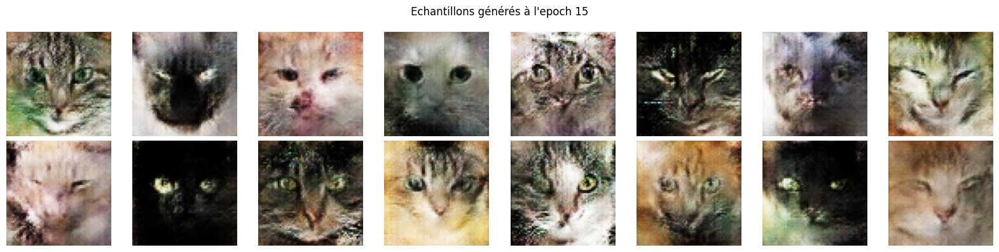

Epoch [16/50]  D_loss: 0.6235  G_loss: 0.6455
Epoch [17/50]  D_loss: 0.5885  G_loss: 0.8344
Epoch [18/50]  D_loss: 0.6275  G_loss: 0.4230
Epoch [19/50]  D_loss: 0.5871  G_loss: 0.4344
Epoch [20/50]  D_loss: 0.6090  G_loss: 0.7493


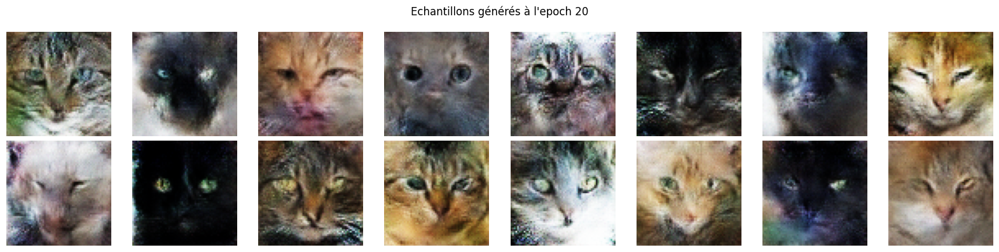

Epoch [21/50]  D_loss: 0.5464  G_loss: 0.6703
Epoch [22/50]  D_loss: 0.4743  G_loss: 1.1869
Epoch [23/50]  D_loss: 0.6168  G_loss: 0.4291
Epoch [24/50]  D_loss: 0.6712  G_loss: 2.7412
Epoch [25/50]  D_loss: 0.6253  G_loss: 1.4326


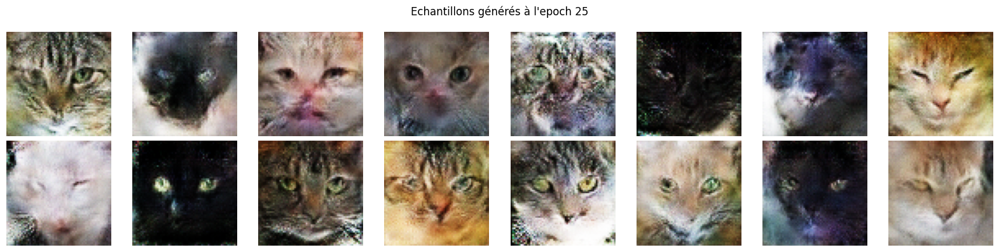

Epoch [26/50]  D_loss: 0.3799  G_loss: 0.7254
Epoch [27/50]  D_loss: 0.4401  G_loss: 0.5933
Epoch [28/50]  D_loss: 0.7567  G_loss: 2.3998
Epoch [29/50]  D_loss: 0.6129  G_loss: 0.3852
Epoch [30/50]  D_loss: 0.5262  G_loss: 0.7069


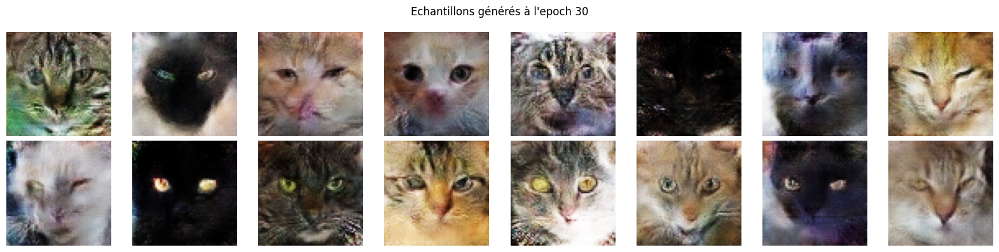

Epoch [31/50]  D_loss: 0.7173  G_loss: 0.4869
Epoch [32/50]  D_loss: 0.5810  G_loss: 2.1659
Epoch [33/50]  D_loss: 0.4922  G_loss: 1.0067
Epoch [34/50]  D_loss: 0.4229  G_loss: 1.3042
Epoch [35/50]  D_loss: 0.7554  G_loss: 0.4428


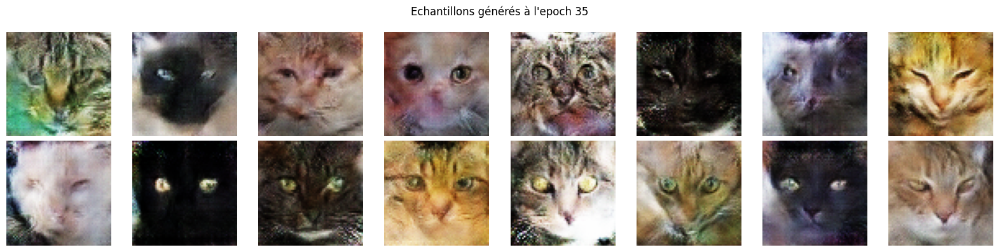

Epoch [36/50]  D_loss: 0.4976  G_loss: 0.4395
Epoch [37/50]  D_loss: 0.6036  G_loss: 0.4099
Epoch [38/50]  D_loss: 0.4749  G_loss: 0.9263
Epoch [39/50]  D_loss: 0.4761  G_loss: 0.8294
Epoch [40/50]  D_loss: 0.4655  G_loss: 0.5822


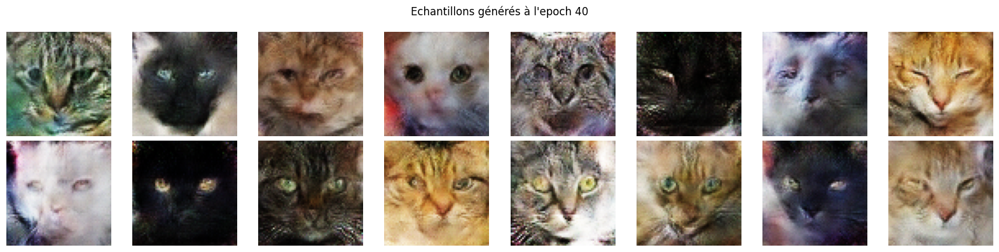

Epoch [41/50]  D_loss: 0.4298  G_loss: 0.9769
Epoch [42/50]  D_loss: 0.4576  G_loss: 0.4484
Epoch [43/50]  D_loss: 0.7765  G_loss: 3.4549
Epoch [44/50]  D_loss: 0.4301  G_loss: 0.6651
Epoch [45/50]  D_loss: 0.4697  G_loss: 1.1348


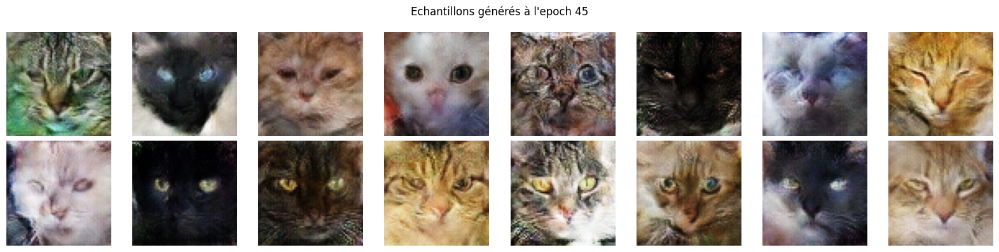

Epoch [46/50]  D_loss: 0.5185  G_loss: 1.0645
Epoch [47/50]  D_loss: 0.7286  G_loss: 0.4338
Epoch [48/50]  D_loss: 0.7753  G_loss: 0.4808
Epoch [49/50]  D_loss: 0.7047  G_loss: 1.6578
Epoch [50/50]  D_loss: 0.4134  G_loss: 0.6781


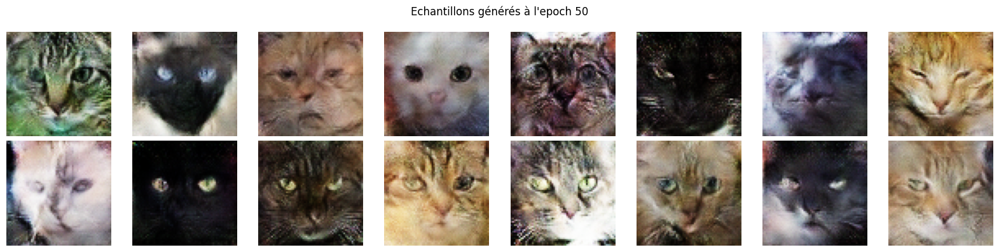

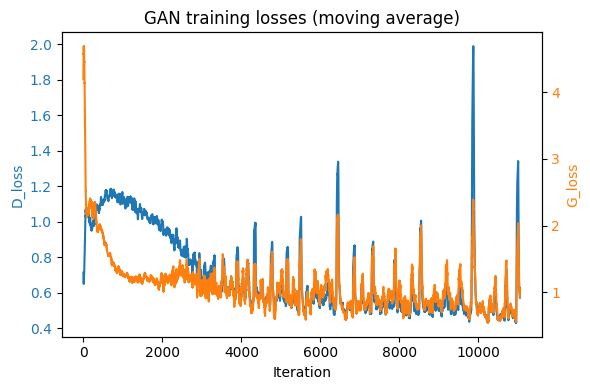

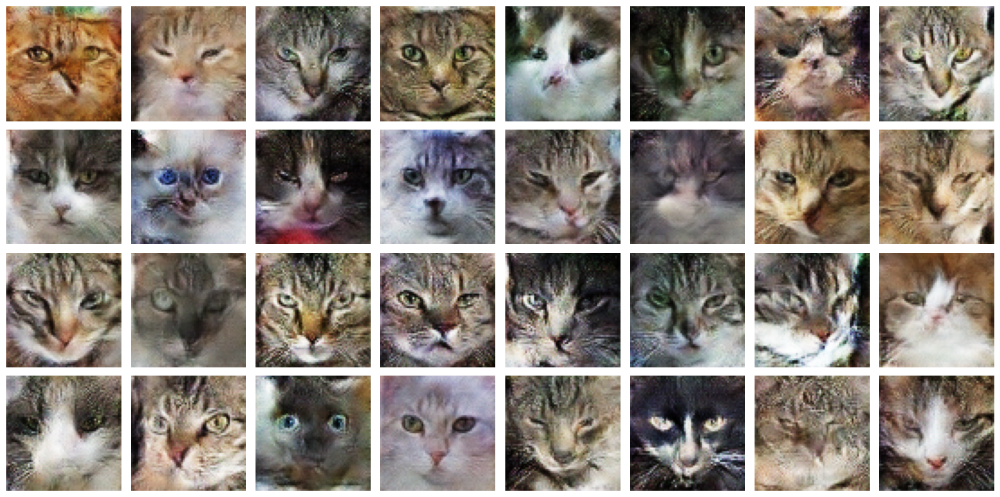

In [12]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np

# 1. Initialisation modèles

latent_dim = 128
G = Generator(latent_dim).to(device)
D = Discriminator().to(device)

# Test rapide des shapes
z = torch.randn(16, latent_dim, device=device)
fake = G(z)
print("fake:", fake.shape)   # attendu: torch.Size([16, 3, 64, 64])
out = D(fake)
print("D(fake):", out.shape) # attendu: torch.Size([16, 1])

# 2. Optimiseurs + loss

lr_G = 2e-4
lr_D = 1e-4

optimizer_D = torch.optim.Adam(D.parameters(), lr=lr_D, betas=(0.0, 0.999))
optimizer_G = torch.optim.Adam(G.parameters(), lr=lr_G, betas=(0.5, 0.999))
criterion = nn.BCELoss()


# 3. Boucle d'entraînement

num_epochs = 50

G_losses = []
D_losses = []

# Bruit fixe pour visualisations intermédiaires
fixed_noise = torch.randn(16, latent_dim, device=device)

sigma = 0.05  # intensité du bruit pour le discriminateur

for epoch in range(num_epochs):
    for batch in train_loader:
        real_images = batch[0].to(device)        # (B, 3, 64, 64)
        batch_size = real_images.size(0)

        # Label smoothing : réel = 0.9, faux = 0.0
        real_labels = torch.ones(batch_size, 1, device=device) * 0.9
        fake_labels = torch.zeros(batch_size, 1, device=device)


        # 1) Mise à jour du Discriminateur
        optimizer_D.zero_grad()

        # Génération des fausses images
        noise = torch.randn(batch_size, latent_dim, device=device)
        fake_images = G(noise)

        # Ajout d'un léger bruit gaussien pour stabiliser D
        real_noisy = real_images + sigma * torch.randn_like(real_images)
        fake_noisy = fake_images.detach() + sigma * torch.randn_like(fake_images)

        # On reste dans la plage [-1, 1] (sortie du générateur avec Tanh)
        real_noisy = torch.clamp(real_noisy, -1, 1)
        fake_noisy = torch.clamp(fake_noisy, -1, 1)

        # D sur vraies images
        out_real = D(real_noisy)
        loss_real = criterion(out_real, real_labels)

        # D sur fausses images
        out_fake = D(fake_noisy)
        loss_fake = criterion(out_fake, fake_labels)

        d_loss = loss_real + loss_fake
        d_loss.backward()
        optimizer_D.step()

        # 2) Mise à jour du Générateur
        optimizer_G.zero_grad()

        noise = torch.randn(batch_size, latent_dim, device=device)
        fake_images = G(noise)
        out_fake_for_G = D(fake_images)

        # Le générateur veut que D(faux) = "réel"
        g_loss = criterion(out_fake_for_G, real_labels)

        g_loss.backward()
        optimizer_G.step()

        D_losses.append(d_loss.item())
        G_losses.append(g_loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}]  D_loss: {d_loss.item():.4f}  G_loss: {g_loss.item():.4f}")

    # Visualisation intermédiaire tous les 5 epochs
    if (epoch + 1) % 5 == 0:
        G.eval()
        with torch.no_grad():
            fake_vis = G(fixed_noise).detach().cpu()
        G.train()

        # [-1, 1] -> [0, 1] pour affichage
        fake_vis = (fake_vis + 1) / 2

        fig, axes = plt.subplots(2, 8, figsize=(16, 4))
        for i in range(16):
            ax = axes[i // 8, i % 8]
            img = fake_vis[i].permute(1, 2, 0).numpy()
            img = np.clip(img, 0, 1)
            ax.imshow(img)
            ax.axis("off")
        plt.suptitle(f"Echantillons générés à l'epoch {epoch+1}")
        plt.tight_layout()
        plt.show()

# 4. Courbes de loss (lissées)
def moving_average(x, window=50):
    x = np.array(x)
    if len(x) < window:
        return x
    return np.convolve(x, np.ones(window)/window, mode="valid")

d_smooth = moving_average(D_losses, window=50)
g_smooth = moving_average(G_losses, window=50)
iters = np.arange(len(d_smooth))

fig, ax1 = plt.subplots(figsize=(6, 4))

ax1.plot(iters, d_smooth, label="D_loss (smooth)", color="C0")
ax1.set_xlabel("Iteration")
ax1.set_ylabel("D_loss", color="C0")
ax1.tick_params(axis="y", labelcolor="C0")

ax2 = ax1.twinx()
ax2.plot(iters, g_smooth, label="G_loss (smooth)", color="C1")
ax2.set_ylabel("G_loss", color="C1")
ax2.tick_params(axis="y", labelcolor="C1")

plt.title("GAN training losses (moving average)")
fig.tight_layout()
plt.show()

# 5. Grille finale d'images générées
G.eval()
with torch.no_grad():
    z = torch.randn(32, latent_dim, device=device)
    samples = G(z).detach().cpu()

samples = (samples + 1) / 2  # [-1,1] -> [0,1]

fig, axes = plt.subplots(4, 8, figsize=(16, 8))
for i in range(32):
    ax = axes[i // 8, i % 8]
    img = samples[i].permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    ax.axis("off")
plt.tight_layout()
plt.show()

## **Diffusion model**

- Define forward diffusion process (adding noise)
- Build a U-Net to predict noise
- Train to denoise images at different timesteps
- Generate new cats through reverse diffusion
